In [1]:
import numpy as np
import cv2 
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
from matplotlib.pyplot import figure


(1887, 2048)


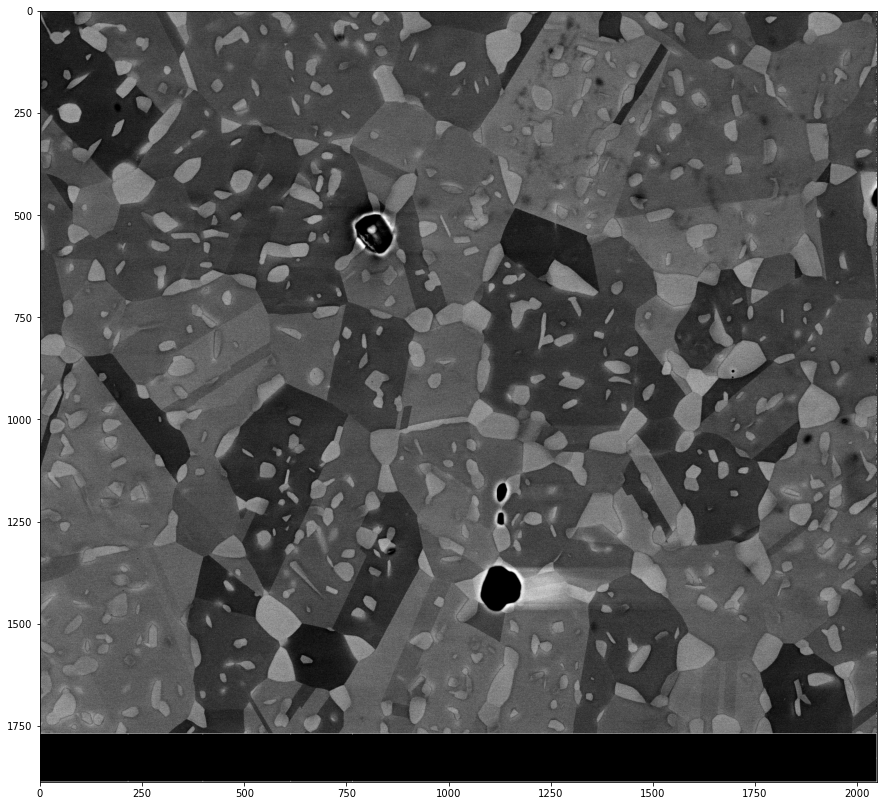

In [4]:
img=cv2.imread('images/train_images/0900C_0100h_area2.tif')
img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
print(img.shape)
fig = plt.figure(figsize=(15, 15))
plt.imshow(img,cmap='gray')

In [5]:
#SAVE ORIGINAL IMAGE PIXELS INTO A DATAFRAME

img2=img.reshape(-1)
df=pd.DataFrame()
df['original image']=img2

In [6]:
print(img2.shape)

(3864576,)


In [7]:
#Generate Gabor features
num = 1  #To count numbers up in order to give Gabor features a lable in the data frame
kernels = []
for theta in range(2):   #Define number of thetas
    theta = theta / 4. * np.pi
    for sigma in (1, 3):  #Sigma with 1 and 3
        for lamda in np.arange(0, np.pi, np.pi / 4):   #Range of wavelengths
            for gamma in (0.05, 0.5):   #Gamma values of 0.05 and 0.5
            
                
                gabor_label = 'Gabor' + str(num)  #Label Gabor columns as Gabor1, Gabor2, etc.
#                print(gabor_label)
                ksize=9
                kernel = cv2.getGaborKernel((ksize, ksize), sigma, theta, lamda, gamma, 0, ktype=cv2.CV_32F)    
                kernels.append(kernel)
                #Now filter the image and add values to a new column 
                fimg = cv2.filter2D(img2, cv2.CV_8UC3, kernel)
                filtered_img = fimg.reshape(-1)
                df[gabor_label] = filtered_img  #Labels columns as Gabor1, Gabor2, etc.
                print(gabor_label, ': theta=', theta, ': sigma=', sigma, ': lamda=', lamda, ': gamma=', gamma)
                num += 1  #Increment for gabor column label

Gabor1 : theta= 0.0 : sigma= 1 : lamda= 0.0 : gamma= 0.05
Gabor2 : theta= 0.0 : sigma= 1 : lamda= 0.0 : gamma= 0.5
Gabor3 : theta= 0.0 : sigma= 1 : lamda= 0.7853981633974483 : gamma= 0.05
Gabor4 : theta= 0.0 : sigma= 1 : lamda= 0.7853981633974483 : gamma= 0.5
Gabor5 : theta= 0.0 : sigma= 1 : lamda= 1.5707963267948966 : gamma= 0.05
Gabor6 : theta= 0.0 : sigma= 1 : lamda= 1.5707963267948966 : gamma= 0.5
Gabor7 : theta= 0.0 : sigma= 1 : lamda= 2.356194490192345 : gamma= 0.05
Gabor8 : theta= 0.0 : sigma= 1 : lamda= 2.356194490192345 : gamma= 0.5
Gabor9 : theta= 0.0 : sigma= 3 : lamda= 0.0 : gamma= 0.05
Gabor10 : theta= 0.0 : sigma= 3 : lamda= 0.0 : gamma= 0.5
Gabor11 : theta= 0.0 : sigma= 3 : lamda= 0.7853981633974483 : gamma= 0.05
Gabor12 : theta= 0.0 : sigma= 3 : lamda= 0.7853981633974483 : gamma= 0.5
Gabor13 : theta= 0.0 : sigma= 3 : lamda= 1.5707963267948966 : gamma= 0.05
Gabor14 : theta= 0.0 : sigma= 3 : lamda= 1.5707963267948966 : gamma= 0.5
Gabor15 : theta= 0.0 : sigma= 3 : lamda= 2

In [ ]:
###################################################################
#Gerate OTHER FEATURES and add them to the data frame
                

In [8]:
from skimage.filters import roberts, sobel, scharr, prewitt

In [9]:
img.shape

(1887, 2048)

(3864576,)


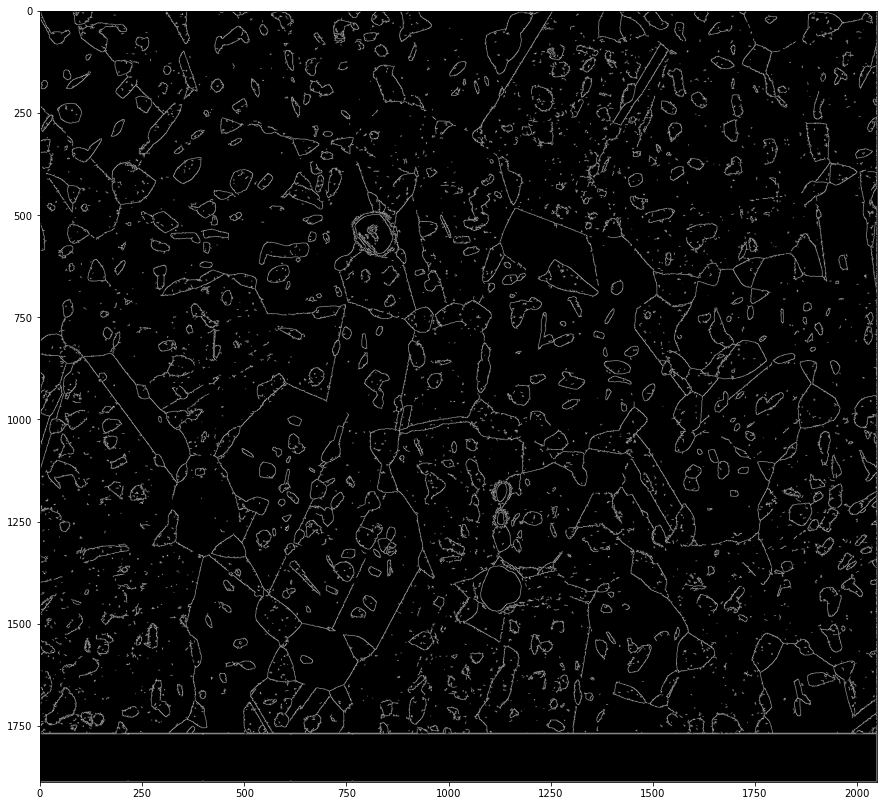

In [10]:
#CANNY EDGE
edges = cv2.Canny(img, 100,200)   #Image, min and max values
edges1 = edges.reshape(-1)
df['Canny Edge'] = edges1 #Add column to original dataframe
fig = plt.figure(figsize=(15, 15))
plt.imshow(edges,cmap='gray')
print(edges1.shape)

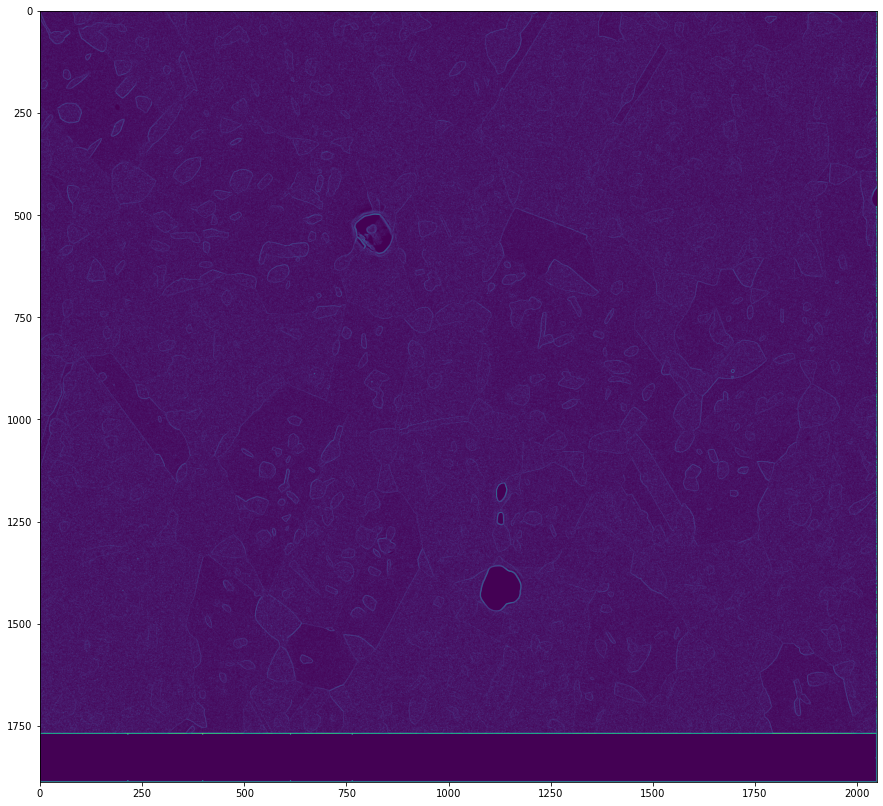

In [11]:
#ROBERTS EDGE
edge_roberts = roberts(img)
edge_roberts1 = edge_roberts.reshape(-1)
df['Roberts'] = edge_roberts1
fig = plt.figure(figsize=(15, 15))
plt.imshow(edge_roberts)

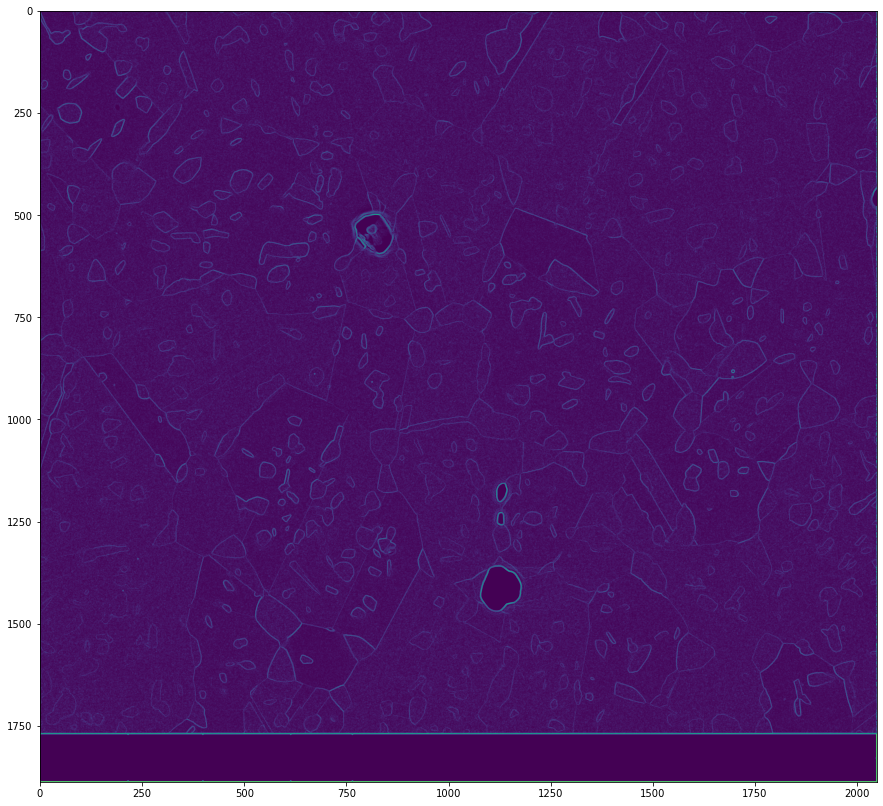

In [12]:
#SOBEL
edge_sobel = sobel(img)
edge_sobel1 = edge_sobel.reshape(-1)
df['Sobel'] = edge_sobel1
fig = plt.figure(figsize=(15, 15))
plt.imshow(edge_sobel)

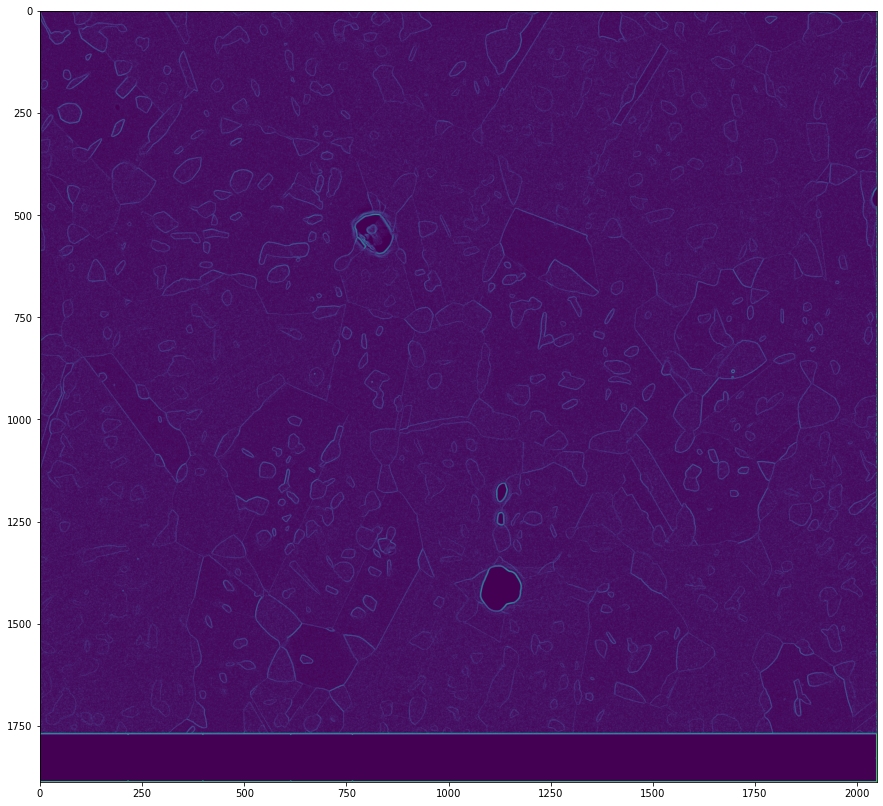

In [13]:
#SCHARR
edge_scharr = scharr(img)
edge_scharr1 = edge_scharr.reshape(-1)
df['Scharr'] = edge_scharr1
fig = plt.figure(figsize=(15, 15))
plt.imshow(edge_scharr)

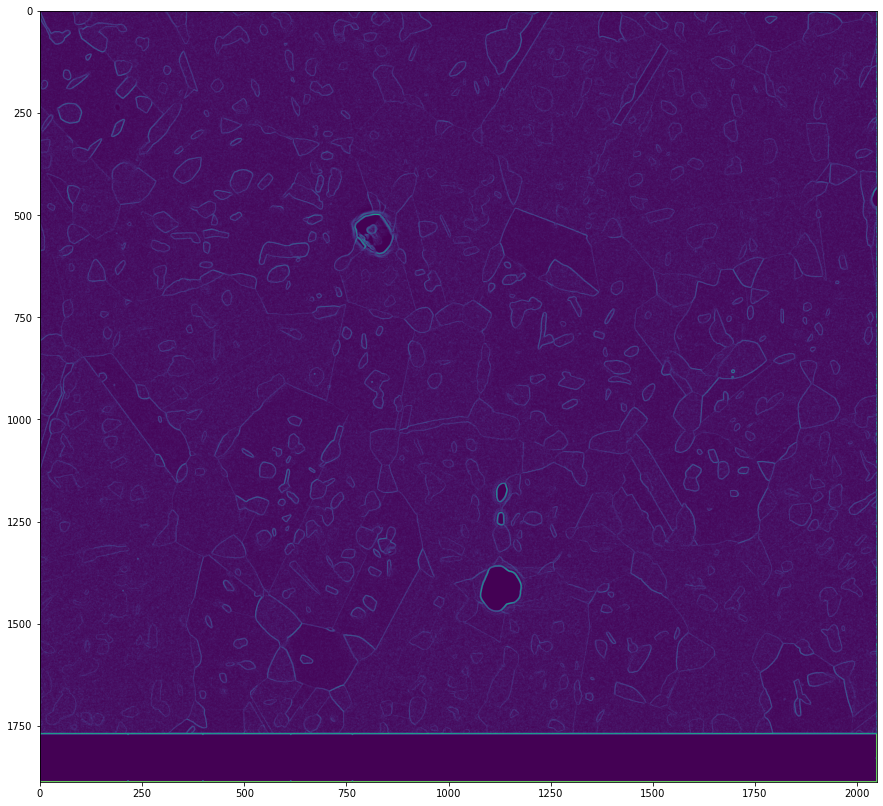

In [14]:
#PREWITT
edge_prewitt = prewitt(img)
edge_prewitt1 = edge_prewitt.reshape(-1)
df['Prewitt'] = edge_prewitt1
fig = plt.figure(figsize=(15, 15))
plt.imshow(edge_prewitt)

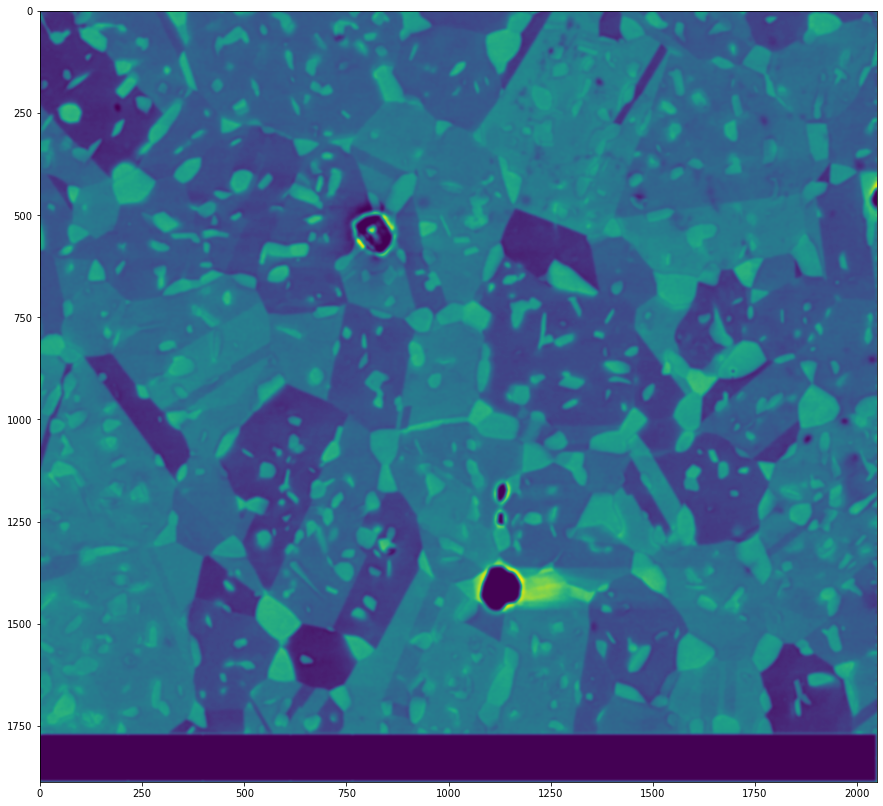

In [15]:
#GAUSSIAN with sigma=3
from scipy import ndimage as nd
gaussian_img = nd.gaussian_filter(img, sigma=3)
gaussian_img1 = gaussian_img.reshape(-1)
df['Gaussian s3'] = gaussian_img1
fig = plt.figure(figsize=(15, 15))
plt.imshow(gaussian_img)

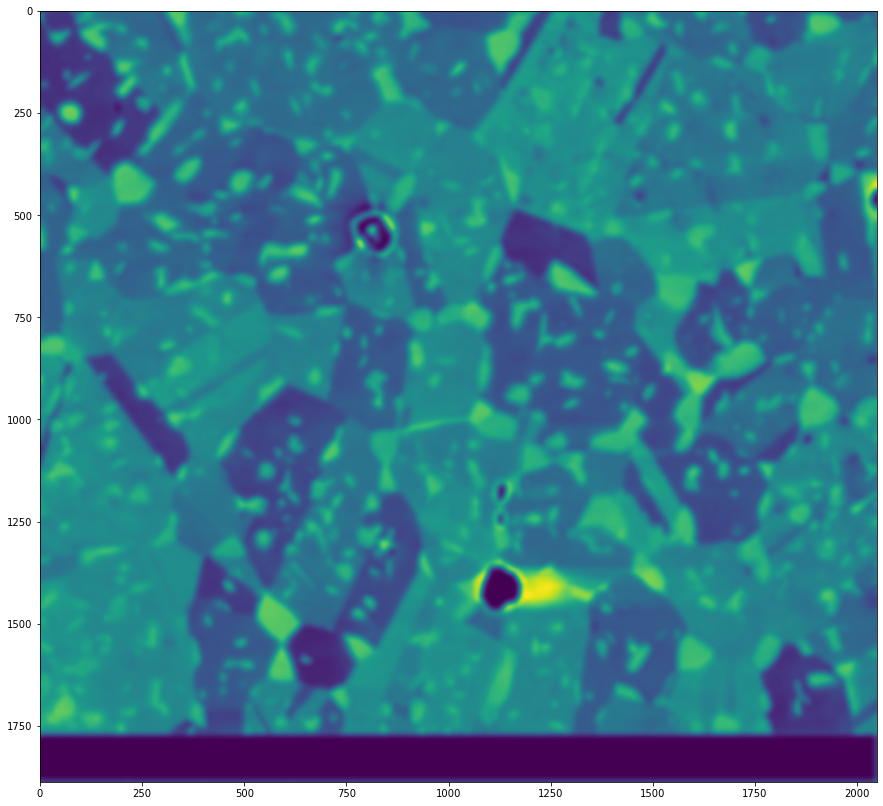

In [16]:
#GAUSSIAN with sigma=7
gaussian_img2 = nd.gaussian_filter(img, sigma=7)
gaussian_img3 = gaussian_img2.reshape(-1)
df['Gaussian s7'] = gaussian_img3
fig = plt.figure(figsize=(15, 15))
plt.imshow(gaussian_img2)

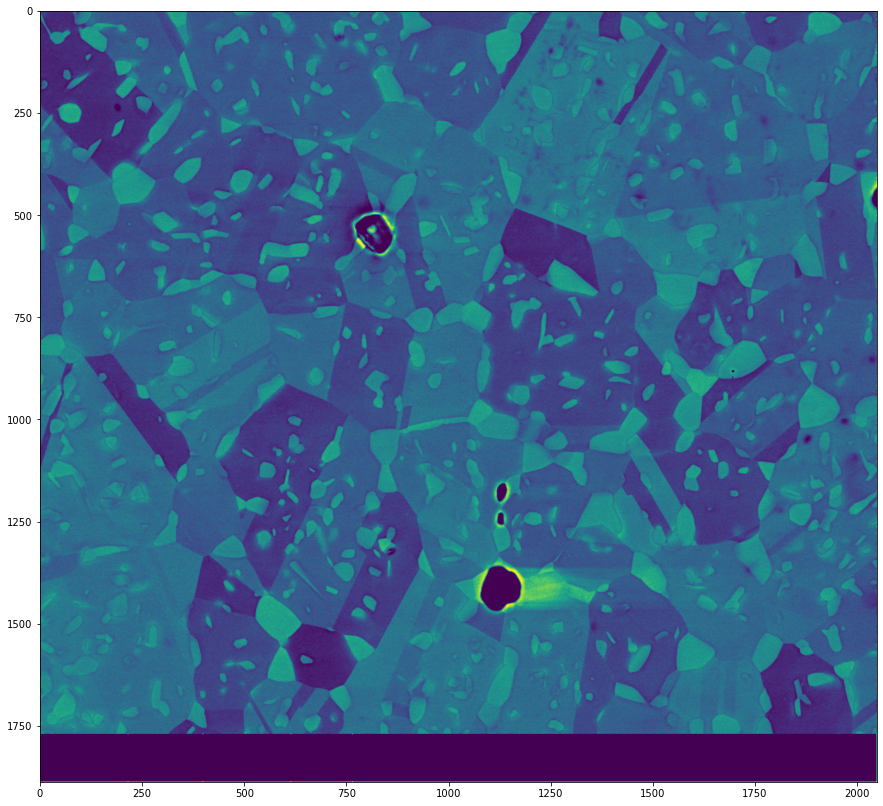

In [17]:



#MEDIAN with sigma=3
median_img = nd.median_filter(img, size=3)
median_img1 = median_img.reshape(-1)
df['Median s3'] = median_img1
fig = plt.figure(figsize=(15, 15))
plt.imshow(median_img)

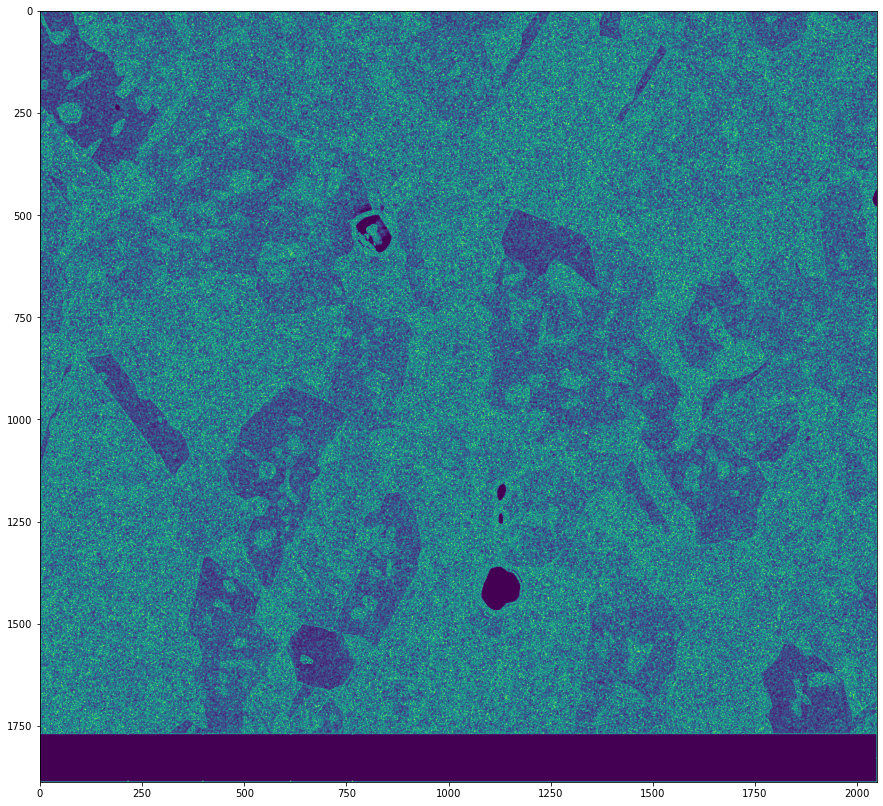

In [18]:
#VARIANCE with size=3
variance_img = nd.generic_filter(img, np.var, size=3)
variance_img1 = variance_img.reshape(-1)
df['Variance s3'] = variance_img1  #Add column to original dataframe
fig = plt.figure(figsize=(15, 15))
plt.imshow(variance_img)

(1887, 2048, 3)


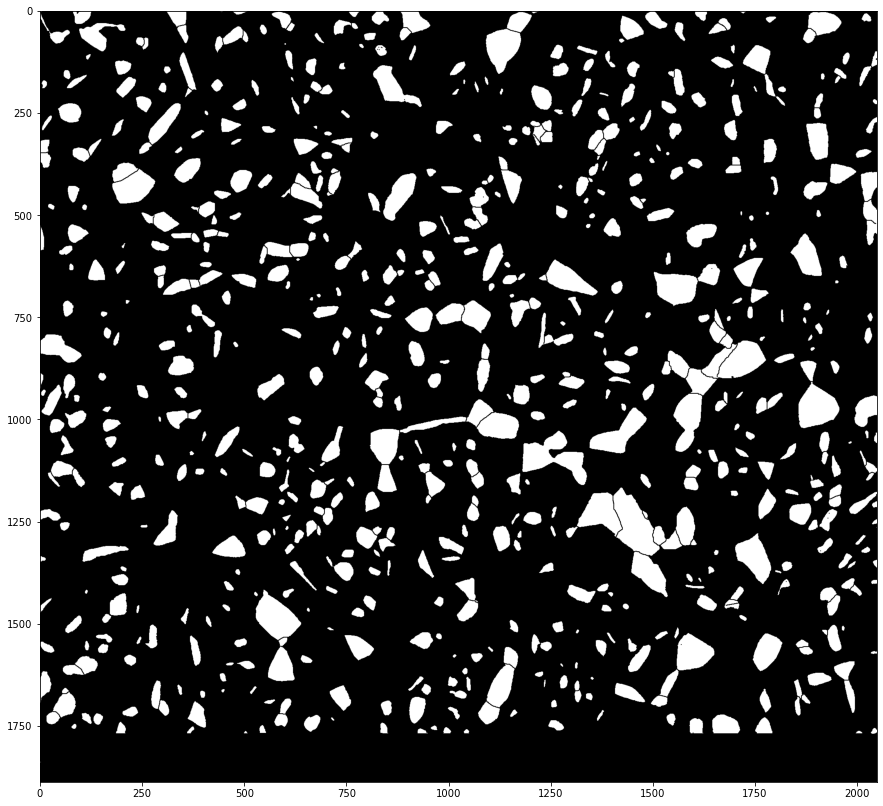

In [19]:
labeled_img = cv2.imread('images/train_masks/0900C_0100h_area2_denoised_BW1.tif')
print(labeled_img.shape)
fig = plt.figure(figsize=(15, 15))
plt.imshow(labeled_img,cmap='gray')

In [20]:
labeled_img.shape


(1887, 2048, 3)

In [21]:
labeled_img = cv2.cvtColor(labeled_img, cv2.COLOR_BGR2GRAY)
labeled_img.shape

(1887, 2048)

In [22]:
# Define the background class label and the single class label
background_label = 'Background'
single_class_label = 'Single Class'

# Create a separate image array to store class-assigned image
class_image = np.zeros_like(labeled_img, dtype=np.uint8)

# Assign the background class label to pixel value 0
class_image[labeled_img == 0] = 0

# Assign the single class label to all other pixel values
class_image[labeled_img != 0] = 1

# Save the class-assigned image
output_image_path = 'class_0900C_0100h_area2_denoised_BW1.tif'
cv2.imwrite(output_image_path, class_image)

True

In [23]:
#Now, add a column in the data frame for the Labels
#For this, we need to import the labeled image
labeled_img = cv2.imread('class_0900C_0100h_area2_denoised_BW1.tif')
labeled_img = cv2.cvtColor(labeled_img, cv2.COLOR_BGR2GRAY)
print(labeled_img.shape)
labeled_img = labeled_img.reshape(-1)
df['Labels'] = labeled_img


(1887, 2048)


In [24]:
print(df.head())

   original image  Gabor1  Gabor2  Gabor3  Gabor4  Gabor5  Gabor6  Gabor7  \
0              27       0       0     139      76      45      25      18   
1              32       0       0     139      76      45      25      18   
2              21       0       0     145      77      47      25      19   
3              23       0       0     148      79      48      25      19   
4              33       0       0     152      82      49      26      20   

   Gabor8  Gabor9  ...  Canny Edge   Roberts     Sobel    Scharr   Prewitt  \
0      10       0  ...           0  0.056558  0.046772  0.051787  0.041769   
1      10       0  ...           0  0.006201  0.028834  0.023678  0.038612   
2      10       0  ...           0  0.059538  0.023242  0.027453  0.018510   
3      10       0  ...           0  0.048428  0.046338  0.049158  0.042609   
4      11       0  ...           0  0.022356  0.021164  0.022901  0.019586   

   Gaussian s3  Gaussian s7  Median s3  Variance s3  Labels  
0     

In [25]:
##################################See features responses on Labels by plotting######

In [26]:
#Define the dependent variable that needs to be predicted (labels)
Y = df["Labels"].values

In [27]:
#Define the independent variables
X = df.drop(labels = ["Labels"], axis=1) 


In [28]:
#Split data into train and test to verify accuracy after fitting the model. 
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=20)

In [29]:
######################################################################

In [30]:
# Import the model we are using
#RandomForestRegressor is for regression type of problems. 
#For classification we use RandomForestClassifier.
#Both yield similar results except for regressor the result is float
#and for classifier it is an integer. 


In [31]:
from sklearn.ensemble import RandomForestClassifier
# Instantiate model with n number of decision trees
model = RandomForestClassifier(n_estimators = 50, random_state = 42)


In [32]:
# Train the model on training data
import time
start_time = time.time()
model.fit(X_train, y_train)
end_time = time.time()
execution_time = end_time - start_time
print("Execution time:", execution_time/60, "minutes")

Execution time: 18.94319433371226 minutes


In [ ]:
#######################################

In [ ]:
#XGBOOST
#import xgboost as xgb
#model = xgb.XGBClassifier()


In [ ]:
#model.fit(X_train, y_train)

In [33]:
#STEP 8: TESTING THE MODEL BY PREDICTING ON TEST DATA
#AND CALCULATE THE ACCURACY SCORE
#First test prediction on the training data itself. SHould be good. 
prediction_test_train = model.predict(X_train)

In [34]:
prediction_test = model.predict(X_test)

In [35]:
#Let us check the accuracy on test data
from sklearn import metrics

In [36]:
#First check the accuracy on training data. This will be higher than test data prediction accuracy.
print ("Accuracy on training data = ", metrics.accuracy_score(y_train, prediction_test_train))
#Check accuracy on test dataset. If this is too low compared to train it indicates overfitting on training data.
print ("Accuracy = ", metrics.accuracy_score(y_test, prediction_test))

Accuracy on training data =  0.9997832879423999
Accuracy =  0.9591081048910878


In [38]:
import pickle


In [39]:
#Save the trained model as pickle string to disk for future use
filename = "0900C_0100h_area2_model"
pickle.dump(model, open(filename, 'wb'))

In [40]:
#To test the model on future datasets
loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.predict(X)

In [41]:
segmented = result.reshape((img.shape))

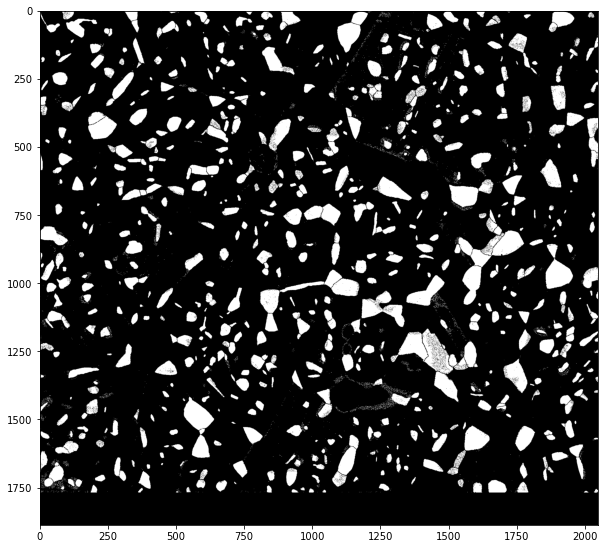

In [43]:
from matplotlib import pyplot as plt
fig = plt.figure(figsize=(10, 10))
plt.imshow(segmented, cmap ='gray')

In [44]:
plt.imsave('0900C_0100h_area2_segmented_sigma.jpg', segmented, cmap ='gray')

In [45]:
from numpy import set_printoptions
import sys

In [ ]:
# np.set_printoptions(threshold=sys.maxsize,precision=4)
# np.array(diff)

In [ ]:
######Feature importences ######

In [46]:
feature_list=list(X.columns)
feature_imp=pd.Series(model.feature_importances_, index=feature_list).sort_values(ascending=False)
print(feature_imp)

Median s3         1.770809e-01
Gaussian s3       1.032796e-01
Gabor6            9.761258e-02
Gabor8            8.762357e-02
Gabor23           7.221154e-02
Gabor7            6.720550e-02
Gaussian s7       4.310191e-02
Gabor5            4.293422e-02
Gabor24           3.826012e-02
original image    3.678584e-02
Gabor29           2.665192e-02
Gabor4            2.590716e-02
Prewitt           2.278258e-02
Roberts           2.148262e-02
Sobel             2.144090e-02
Scharr            2.065729e-02
Gabor31           2.027350e-02
Gabor21           1.884061e-02
Gabor32           1.816920e-02
Variance s3       1.799592e-02
Gabor30           1.165930e-02
Gabor11           2.790355e-03
Canny Edge        2.538433e-03
Gabor3            8.054620e-04
Gabor22           6.698520e-04
Gabor12           5.746692e-04
Gabor20           3.390199e-04
Gabor28           3.253212e-04
Gabor27           1.191680e-07
Gabor19           1.750443e-09
Gabor1            0.000000e+00
Gabor2            0.000000e+00
Gabor9  

In [47]:
def feature_extraction(img):
    df = pd.DataFrame()


#All features generated must match the way features are generated for TRAINING.
#Feature1 is our original image pixels
    img2 = img.reshape(-1)
    df['original image'] = img2

#Generate Gabor features
    num = 1
    kernels = []
    for theta in range(2):
        theta = theta / 4. * np.pi
        for sigma in (1, 3):
            for lamda in np.arange(0, np.pi, np.pi / 4):
                for gamma in (0.05, 0.5):
#               print(theta, sigma, , lamda, frequency)
                
                    gabor_label = 'Gabor' + str(num)
#                    print(gabor_label)
                    ksize=9
                    kernel = cv2.getGaborKernel((ksize, ksize), sigma, theta, lamda, gamma, 0, ktype=cv2.CV_32F)    
                    kernels.append(kernel)
                    #Now filter image and add values to new column
                    fimg = cv2.filter2D(img2, cv2.CV_8UC3, kernel)
                    filtered_img = fimg.reshape(-1)
                    df[gabor_label] = filtered_img  #Modify this to add new column for each gabor
                    num += 1
########################################
#Geerate OTHER FEATURES and add them to the data frame
#Feature 3 is canny edge
    edges = cv2.Canny(img, 100,200)   #Image, min and max values
    edges1 = edges.reshape(-1)
    df['Canny Edge'] = edges1 #Add column to original dataframe

    from skimage.filters import roberts, sobel, scharr, prewitt

#Feature 4 is Roberts edge
    edge_roberts = roberts(img)
    edge_roberts1 = edge_roberts.reshape(-1)
    df['Roberts'] = edge_roberts1

#Feature 5 is Sobel
    edge_sobel = sobel(img)
    edge_sobel1 = edge_sobel.reshape(-1)
    df['Sobel'] = edge_sobel1

#Feature 6 is Scharr
    edge_scharr = scharr(img)
    edge_scharr1 = edge_scharr.reshape(-1)
    df['Scharr'] = edge_scharr1

    #Feature 7 is Prewitt
    edge_prewitt = prewitt(img)
    edge_prewitt1 = edge_prewitt.reshape(-1)
    df['Prewitt'] = edge_prewitt1

    #Feature 8 is Gaussian with sigma=3
    from scipy import ndimage as nd
    gaussian_img = nd.gaussian_filter(img, sigma=3)
    gaussian_img1 = gaussian_img.reshape(-1)
    df['Gaussian s3'] = gaussian_img1

    #Feature 9 is Gaussian with sigma=7
    gaussian_img2 = nd.gaussian_filter(img, sigma=7)
    gaussian_img3 = gaussian_img2.reshape(-1)
    df['Gaussian s7'] = gaussian_img3

    #Feature 10 is Median with sigma=3
    median_img = nd.median_filter(img, size=3)
    median_img1 = median_img.reshape(-1)
    df['Median s3'] = median_img1

    #Feature 11 is Variance with size=3
    variance_img = nd.generic_filter(img, np.var, size=3)
    variance_img1 = variance_img.reshape(-1)
    df['Variance s3'] = variance_img1  #Add column to original dataframe


    return df


(1887, 2048)


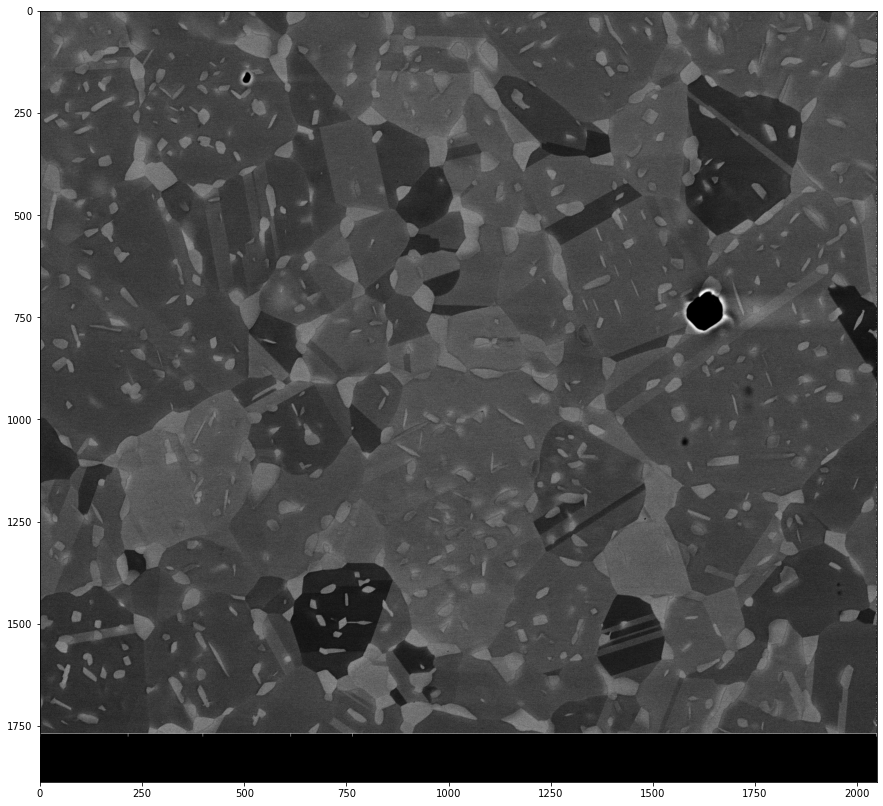

In [58]:
img=cv2.imread('images/train_images/0900C_0010h_area3.tif')
img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
print(img.shape)
fig = plt.figure(figsize=(15, 15))
plt.imshow(img,cmap='gray')

In [59]:
import pickle

In [60]:
filename = "0900C_0100h_area2_model"

In [61]:
loaded_model = pickle.load(open(filename, 'rb'))

In [62]:
X_new=feature_extraction(img)


In [63]:
result = loaded_model.predict(X_new)

In [64]:
segmented = result.reshape((img.shape))

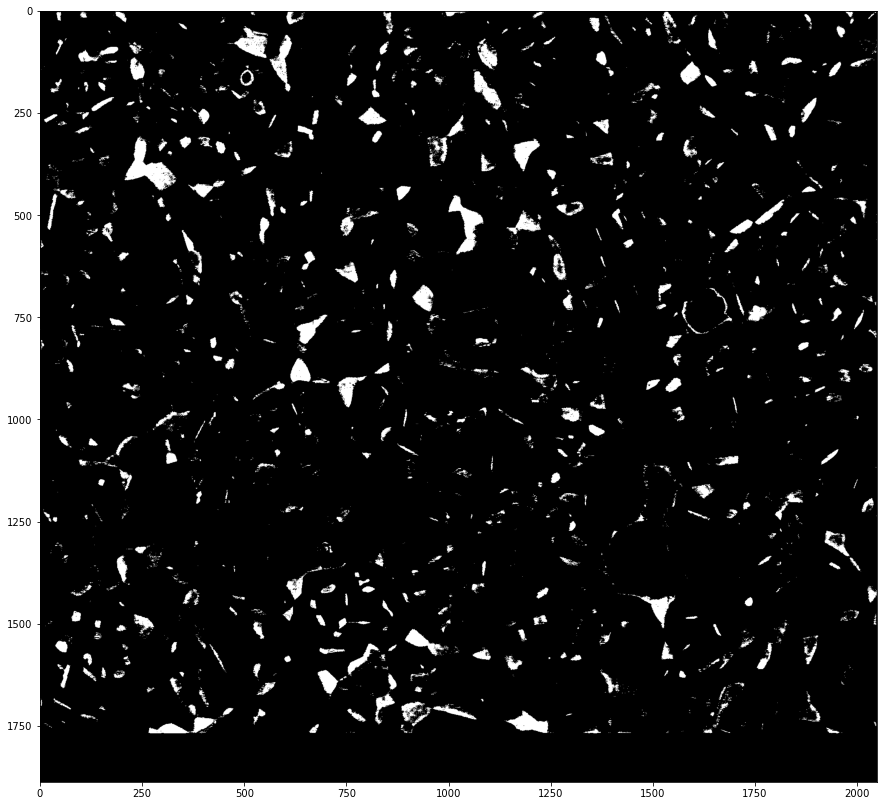

In [65]:
from matplotlib import pyplot as plt
fig = plt.figure(figsize=(15, 15))
plt.imshow(segmented, cmap ='gray')

In [66]:
plt.imsave('area2model_0900C_0010h_area3.jpg', segmented, cmap ='gray')